In [1]:
import numpy as np
import pandas as pd
import pickle as pkl
import json

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler

from sklearn.feature_selection import mutual_info_classif,f_classif,chi2,SelectKBest
from skfeature.function.similarity_based import fisher_score
from sklearn.decomposition import PCA

from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
import xgboost

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

# 1) Problem Statement

Identify the problem

Breast cancer is the most common malignancy among women, accounting for nearly 1 in 3 cancers diagnosed among women in the United States, and it is the second leading cause of cancer death among women. Breast Cancer occurs as a results of abnormal growth of cells in the breast tissue, commonly referred to as a Tumor. A tumor does not mean cancer - tumors can be benign (not cancerous), pre-malignant (pre-cancerous), or malignant (cancerous). Tests such as MRI, mammogram, ultrasound and biopsy are commonly used to diagnose breast cancer performed. 

Expected outcome

Given breast cancer results from breast fine needle aspiration (FNA) test (is a quick and simple procedure to perform, which removes some fluid or cells from a breast lesion or cyst (a lump, sore or swelling) with a fine needle similar to a blood sample needle). Since this build a model that can classify a breast cancer tumor using two training classification:
1= Malignant (Cancerous) - Present
0= Benign (Not Cancerous) -Absent

Objective 

Since the labels in the data are discrete, the predication falls into two categories, (i.e. Malignant or benign). In machine learning this is a classification problem. Thus, the goal is to classify whether the breast cancer is benign or malignant and predict the recurrence and non-recurrence of malignant cases after a certain period.  To achieve this we have used machine learning classification methods to fit a function that can predict the discrete class of new input
 ML Classification Method applied:
SVM - Support Vector Machine” (SVM) is a supervised machine learning algorithm which can be used for both classification and regression analysis. It segregates two classes using a hyper plane.

Identify data sources
The Breast Cancer datasets is available machine learning repository maintained by the University of California, Irvine. 
NB_2 Getting Started: 
1-	Load libraries and set options  – Import necessary libraries and offer explanation on each
2-	Obtaining Data- Data Set
The next step is to use the UCI Machine Learning Repository to load the Breast Cancer dataset that had 14 attributes and 48,842 instances with which to build a model. The hypothesis is that it is possible predict the recurrence and non-recurrence of malignant cases after a certain period, based upon breast cancer tumor attributes is benign or malignant. The suggested task is to build a binary classifier that can determine from the Breast Cancer dataset information whether or not a tumor is benign or malignant. .
For this tutorial, we selected a Census Income dataset that had 14 attributes and 48,842 instances.


# 2) Data Collection

In [2]:
df=pd.read_html(r'https://github.com/Jean-njoroge/Breast-cancer-risk-prediction/blob/master/data/data.csv')[0]
df

,Unnamed: 0,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,NaN,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,NaN,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,NaN,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,NaN,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,NaN,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,NaN,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,NaN,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,NaN,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,NaN,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [3]:
df.drop('Unnamed: 0',axis=1,inplace=True)
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


# 3) EDA
In-order to train machine learning algorithm we have to give clean and highly standard dataset to ML model.
To check whether the dataset has all the items in numerical format or not we can use df.info() method.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

##### Check whether all features contains only numbers or NaN Values

In [6]:
df.isna().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

##### There is only one feature which has object data type but in-order to run machine learning algorithm we to have convert it to either int or float data type.

In [7]:
df['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

In [4]:
le=LabelEncoder()
df['diagnosis']=le.fit_transform(df['diagnosis'])
print(df['diagnosis'])

with open(r'C:\Users\Omkar\Desktop\Practice\Datasets\Breast Cancer Wisconsin\artifacts\label_encoder.pkl','wb') as file3:
    pkl.dump(le,file3)

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int32


#### Bivariate Analysis

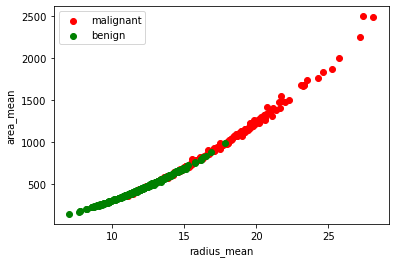

In [5]:
df_M=df[df['diagnosis']==1]
df_B=df[df['diagnosis']==0]
plt.scatter(df_M['radius_mean'],df_M['area_mean'],color="red",label="malignant")
plt.scatter(df_B['radius_mean'],df_B['area_mean'],color="green",label="benign")
plt.legend()
plt.xlabel("radius_mean")
plt.ylabel("area_mean")
plt.show()

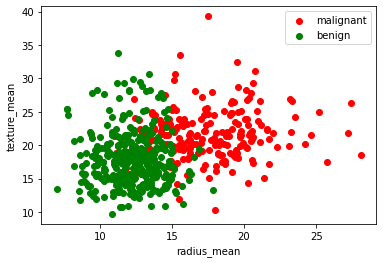

In [6]:
df_M=df[df['diagnosis']==1]
df_B=df[df['diagnosis']==0]
plt.scatter(df_M['radius_mean'],df_M['texture_mean'],color="red",label="malignant")
plt.scatter(df_B['radius_mean'],df_B['texture_mean'],color="green",label="benign")
plt.legend()
plt.xlabel("radius_mean")
plt.ylabel("texture_mean")
plt.show()

Text(0, 0.5, 'concave points_worst')

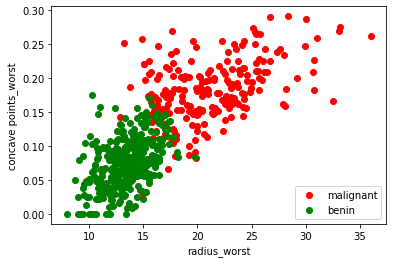

In [7]:
df_M=df[df['diagnosis']==1]
df_B=df[df['diagnosis']==0]
plt.scatter(df_M['radius_worst'],df_M['concave points_worst'],color='red',label='malignant')
plt.scatter(df_B['radius_worst'],df_B['concave points_worst'],color='green',label='benin')
plt.legend()
plt.xlabel('radius_worst')
plt.ylabel('concave points_worst')
# concavity_mean
# concave points_mean
# radius_worst
# perimeter_worst
# area_worst
# concave points_worst

In [16]:
df.corr()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,1.000000,0.039769,0.074626,0.099770,0.073159,0.096893,-0.012968,0.000096,0.050080,0.044158,...,0.082405,0.064720,0.079986,0.107187,0.010338,-0.002968,0.023203,0.035174,-0.044224,-0.029866
diagnosis,0.039769,1.000000,0.730029,0.415185,0.742636,0.708984,0.358560,0.596534,0.696360,0.776614,...,0.776454,0.456903,0.782914,0.733825,0.421465,0.590998,0.659610,0.793566,0.416294,0.323872
radius_mean,0.074626,0.730029,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
texture_mean,0.099770,0.415185,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
perimeter_mean,0.073159,0.742636,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
area_mean,0.096893,0.708984,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
smoothness_mean,-0.012968,0.358560,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
compactness_mean,0.000096,0.596534,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
concavity_mean,0.050080,0.696360,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
concave points_mean,0.044158,0.776614,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661


In [22]:
for i in df.corr().loc['diagnosis',:].to_dict().keys():
    if df.corr().loc['diagnosis',:].to_dict()[i] > 0.69:
        print(i)

diagnosis
radius_mean
perimeter_mean
area_mean
concavity_mean
concave points_mean
radius_worst
perimeter_worst
area_worst
concave points_worst


<Figure size 36000x18000 with 0 Axes>

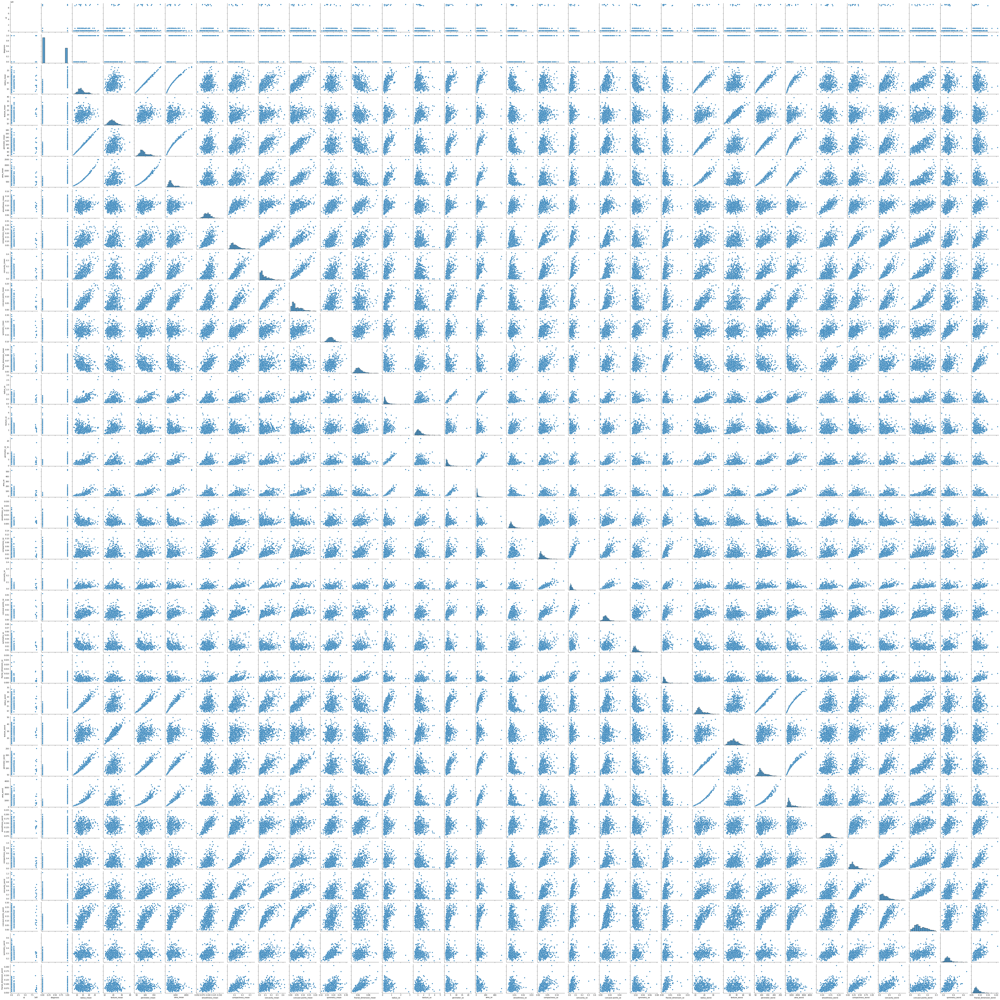

In [9]:
plt.figure(figsize=(500,250))
sns.pairplot(df)

### To check whether our dataset has features with outliers or not we can use quartiles method.
Outliers are those values present in the field which are far from cluster of the normal values. Outliers may affect our accuracy of model.
If outliers are present then we can use different different methods to replace the outliers.

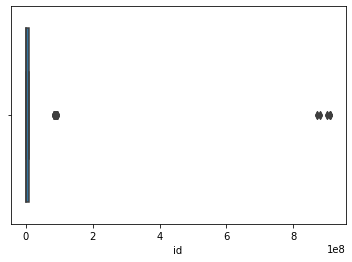

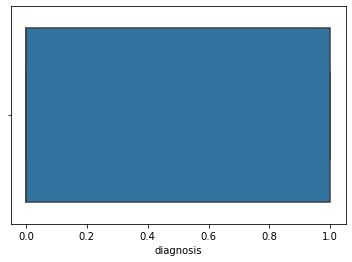

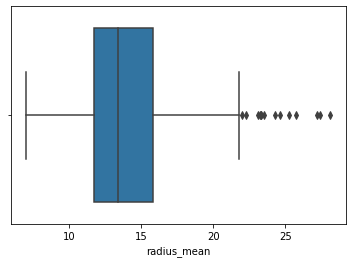

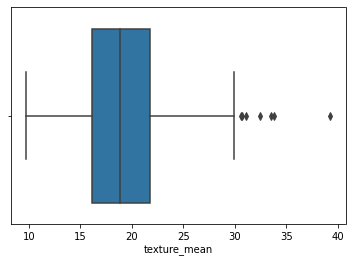

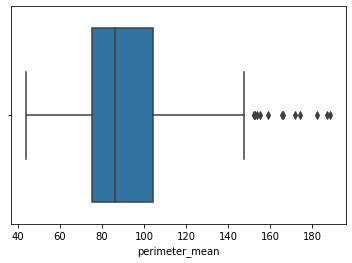

...

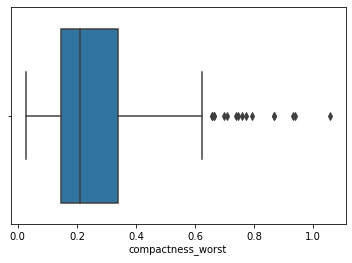

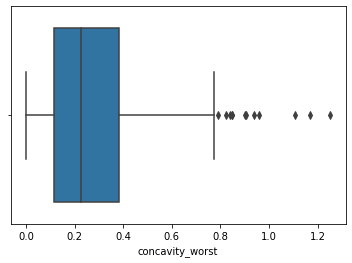

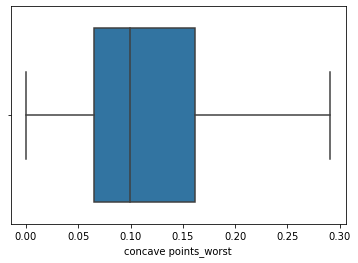

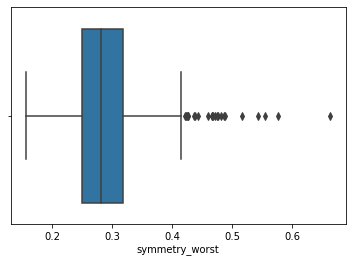

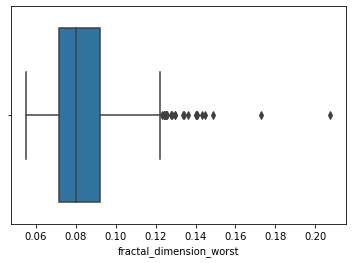

In [9]:
import warnings
warnings.filterwarnings('ignore')
for i in df.columns:
    plt.show()
    sns.boxplot(df[i])

##### Before replacing the outliers, we have to copy the original dataframe(df) so that if something goes wrong during the replacement of outliers we can go back to original dataset and start the operation again.

In [10]:
df1=df.copy()

In [11]:
df['radius_m''ean']=np.log2(df['radius_m''ean'])
df['texture_mean']=np.log2(df['texture_mean'])
df['perimeter_mean']=inv_perimeter=1/df['perimeter_mean']
df['area_mean']=np.log(df['area_mean'])
df['smoothness_mean']=np.log10(df['smoothness_mean'])
df['compactness_mean']=np.log10(df['compactness_mean'])
df['concavity_mean']=np.sqrt(df['concavity_mean'])
df['concave points_mean']=np.sqrt(df['concave points_mean'])
df['symmetry_mean']=1/df['symmetry_mean']
df['fractal_dimension_mean']=np.log10(df['fractal_dimension_mean'])
df['radius_se']=np.log(df['radius_se'])
df['texture_se']=np.log(df['texture_se'])
df['perimeter_se']=np.log(df['perimeter_se'])
df['area_se']=np.log10(df['area_se'])
inverse_smoothness_se=1/df['smoothness_se']
df['smoothness_se']=np.log(inverse_smoothness_se)
df['compactness_se']=np.log(df['compactness_se'])
df['concavity_se']=np.cbrt(df['concavity_se'])
df['concave points_se']=np.log(df['concave points_se'])
df['symmetry_se']=np.log(df['symmetry_se'])
df['radius_worst']=np.log(df['radius_worst'])
df['perimeter_worst']=np.log(df['perimeter_worst'])
df['area_worst']=np.log(df['area_worst'])
df['compactness_worst']=np.log(df['compactness_worst'])
df['concavity_worst']=np.sqrt(df['concavity_worst'])
df['symmetry_worst']=1/df['symmetry_worst']
df['fractal_dimension_se']=np.log(df['fractal_dimension_se'])
df['fractal_dimension_worst']=np.log(df['fractal_dimension_worst'])

# 4) Feature Selection
The original dataset contains 32 fields which are quiet large in numbers which can lead to problem of overfitting, computationally expensive and memory expensive ML algorithm. In order to overcome such problems we can reduce the size of the dataset by removing the fields which are less important or which have less impact on target column. For that we have to use feature selection techniques. 

### 4.1) Pearsons Correlation Coefficient

In [12]:
df.corr()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
id,1.000000,0.039769,0.058485,0.101257,-0.040053,0.061718,-0.010343,-0.002331,0.045272,0.039313,...,0.066630,0.064720,0.061927,0.069384,0.010338,-0.005854,0.025453,0.035174,0.057004,-0.050214
diagnosis,0.039769,1.000000,0.726633,0.428328,-0.710076,0.727883,0.364760,0.596313,0.718227,0.772595,...,0.785367,0.456903,0.793770,0.784062,0.421465,0.583762,0.664181,0.793566,-0.374903,0.321955
radius_mean,0.058485,0.726633,1.000000,0.324042,-0.984658,0.999573,0.162717,0.490026,0.664863,0.791178,...,0.976137,0.298992,0.971389,0.975695,0.104105,0.459520,0.568165,0.740976,-0.151801,0.002794
texture_mean,0.101257,0.428328,0.324042,1.000000,-0.309961,0.326260,-0.015380,0.235399,0.306591,0.277393,...,0.354330,0.907926,0.359814,0.354324,0.078499,0.256777,0.292159,0.306760,-0.098989,0.113300
perimeter_mean,-0.040053,-0.710076,-0.984658,-0.309961,1.000000,-0.984867,-0.176610,-0.510126,-0.669390,-0.792339,...,-0.958177,-0.294826,-0.958237,-0.958305,-0.114840,-0.494334,-0.595677,-0.745446,0.166514,-0.034373
area_mean,0.061718,0.727883,0.999573,0.326260,-0.984867,1.000000,0.153295,0.481081,0.661262,0.786704,...,0.977633,0.301953,0.972485,0.978050,0.098118,0.453552,0.565602,0.736749,-0.146327,-0.003447
smoothness_mean,-0.010343,0.364760,0.162717,-0.015380,-0.176610,0.153295,1.000000,0.688239,0.529430,0.569712,...,0.212223,0.041125,0.236783,0.200776,0.807179,0.499238,0.439171,0.510124,-0.368710,0.504898
compactness_mean,-0.002331,0.596313,0.490026,0.235399,-0.510126,0.481081,0.688239,1.000000,0.885458,0.839657,...,0.532608,0.243644,0.583568,0.520825,0.600317,0.903802,0.832334,0.824062,-0.453094,0.689253
concavity_mean,0.045272,0.718227,0.664863,0.306591,-0.669390,0.661262,0.529430,0.885458,1.000000,0.935124,...,0.692190,0.310411,0.731921,0.686166,0.481692,0.822002,0.926639,0.901215,-0.372510,0.536692
concave points_mean,0.039313,0.772595,0.791178,0.277393,-0.792339,0.786704,0.569712,0.839657,0.935124,1.000000,...,0.811044,0.285043,0.836233,0.804192,0.480636,0.740694,0.820478,0.932214,-0.346121,0.400037


### 4.2) Information Gain

In [13]:
df.drop('id',axis=1,inplace=True)
df2=df.copy()

In [14]:
df2.insert(0,'id',df1['id'])
df2

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,4.169123,3.375735,0.008143,6.908755,-0.926648,-0.556581,0.547814,0.383536,...,3.233961,17.33,5.218191,7.610358,0.16220,-0.407066,0.843742,0.2654,2.173441,-2.129472
1,842517,1,4.362470,4.151372,0.007524,7.189922,-1.071912,-1.104356,0.294788,0.264896,...,3.218476,23.41,5.067646,7.578657,0.12380,-1.678788,0.491528,0.1860,3.636364,-2.418894
2,84300903,1,4.299391,4.409391,0.007692,7.092574,-0.960189,-0.796152,0.444297,0.357631,...,3.159975,25.53,5.027165,7.443664,0.14440,-0.856843,0.671118,0.2430,2.767783,-2.435203
3,84348301,1,3.513491,4.349082,0.012890,5.956096,-0.846185,-0.546835,0.491325,0.324345,...,2.702032,26.50,4.593806,6.341593,0.20980,-0.143524,0.828794,0.2575,1.506478,-1.754464
4,84358402,1,4.342697,3.841973,0.007402,7.167809,-0.998699,-0.876802,0.444972,0.322955,...,3.115292,16.67,5.025195,7.362011,0.13740,-1.584745,0.632456,0.1625,4.230118,-2.566811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,1,4.430285,4.484783,0.007042,7.299121,-0.954677,-0.935917,0.493862,0.372693,...,3.236716,26.40,5.112590,7.614312,0.14100,-1.554476,0.640859,0.2216,4.854369,-2.642965
565,926682,1,4.331275,4.820179,0.007622,7.139660,-1.009661,-0.985479,0.379473,0.312906,...,3.165053,38.25,5.043425,7.456455,0.11660,-1.649219,0.567010,0.1628,3.888025,-2.712510
566,926954,1,4.053111,4.811471,0.009234,6.754721,-1.072886,-0.990124,0.304155,0.230261,...,2.943386,34.12,4.841822,7.024649,0.11390,-1.173120,0.583352,0.1418,4.508566,-2.548486
567,927241,1,4.364572,4.874305,0.007138,7.142827,-0.928855,-0.557520,0.592790,0.389872,...,3.248046,39.42,5.218191,7.507141,0.16500,-0.141448,0.968865,0.2650,2.446782,-2.087474


In [15]:
df2_new=df2[np.isfinite(df2).all(1)]

In [16]:
x=df2.drop('diagnosis',axis=1)
y=df2['diagnosis']

In [17]:
x.shape

(569, 31)

In [18]:
y.shape

(569,)

In [19]:
x_new=x[np.isfinite(x).all(1)]

In [20]:
df2_id=df2['id'].to_list()
x_new_id=x_new['id'].to_list()
removed_id=[]
index_id=[]
for index,i in enumerate(df2_id):
    if i not in x_new_id:
        # print(index,i)
        removed_id.append(i)
        index_id.append(index)

In [21]:
y_df=pd.DataFrame({'id':df2_id,'y':y})
# y_df

In [22]:
y_df.drop(index_id,axis=0,inplace=True)
# y_df

In [23]:
y_df['y'].value_counts()

0    344
1    212
Name: y, dtype: int64

In [24]:
y_new=y_df['y']

In [25]:
array=mutual_info_classif(x_new,y_new)
s1=pd.Series(array,index=x.columns)
s1

id                         0.104914
radius_mean                0.364700
texture_mean               0.099822
perimeter_mean             0.401658
area_mean                  0.357613
smoothness_mean            0.086348
compactness_mean           0.208785
concavity_mean             0.373584
concave points_mean        0.438781
symmetry_mean              0.072792
fractal_dimension_mean     0.016548
radius_se                  0.248292
texture_se                 0.003327
perimeter_se               0.274956
area_se                    0.343671
smoothness_se              0.011471
compactness_se             0.073329
concavity_se               0.108025
concave points_se          0.121725
symmetry_se                0.014734
fractal_dimension_se       0.040787
radius_worst               0.451005
texture_worst              0.126350
perimeter_worst            0.475461
area_worst                 0.464272
smoothness_worst           0.099962
compactness_worst          0.219864
concavity_worst            0

<AxesSubplot:>

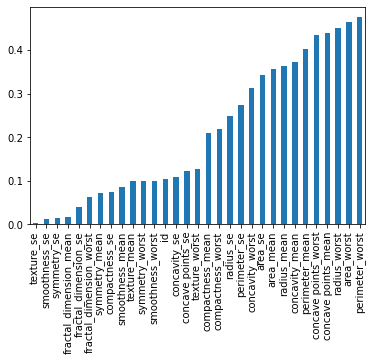

In [26]:
s1.sort_values().plot(kind='bar')

##### The columns that are reduntant according to Information Gain feature selection technique are
texture_se,smoothness_se,symmetry_se,fractal_dimension_mean,fractal_dimension_se,fractal_dimension_worst,symmetry_mean,compactness_se

### 4.3) Fisher Score

In [27]:
arr2=fisher_score.fisher_score(x_new.values,y_new)
arr2

array([ 7,  2,  9, 22,  6, 26, 29, 16, 27, 23,  3, 17, 19, 24,  4,  8, 12,
       28,  5, 13,  1, 25, 14, 21,  0, 10, 18, 15, 30, 11, 20])

In [28]:
s2=pd.Series(arr2,index=x.columns)
s2

id                          7
radius_mean                 2
texture_mean                9
perimeter_mean             22
area_mean                   6
smoothness_mean            26
compactness_mean           29
concavity_mean             16
concave points_mean        27
symmetry_mean              23
fractal_dimension_mean      3
radius_se                  17
texture_se                 19
perimeter_se               24
area_se                     4
smoothness_se               8
compactness_se             12
concavity_se               28
concave points_se           5
symmetry_se                13
fractal_dimension_se        1
radius_worst               25
texture_worst              14
perimeter_worst            21
area_worst                  0
smoothness_worst           10
compactness_worst          18
concavity_worst            15
concave points_worst       30
symmetry_worst             11
fractal_dimension_worst    20
dtype: int32

<AxesSubplot:>

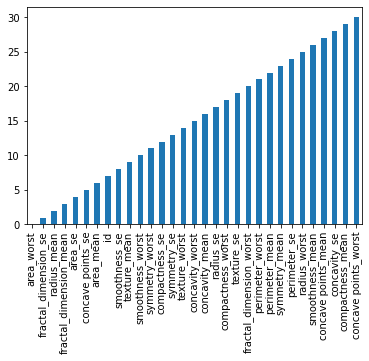

In [29]:
s2.sort_values().plot(kind='bar')

##### The columns that are reduntant according to Fisher Score feature selection technique are
area_worst,fractal_dimension_se,radius_mean,fractal_dimension_mean,area_se,concave_points_se,smoothness_se,texture_mean

### 4.4) Mean Absolute Difference

<AxesSubplot:>

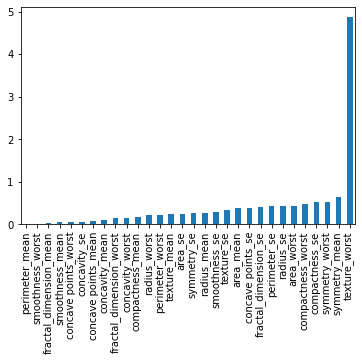

In [30]:
x_new.drop('id',axis=1,inplace=True)
x_mad=np.abs(x_new-np.mean(x_new))
mean=x_mad.mean()  
mean.sort_values().plot(kind='bar')

##### The columns that are reduntant according to Mean Absolute Difference feature selection technique are
perimeter_mean,smoothness_worst,fractal_dimension_mean,smoothness_mean,concave point_worst,concavity_se,concave point_mean

### 4.5) Anova Test

<AxesSubplot:xlabel='Column'>

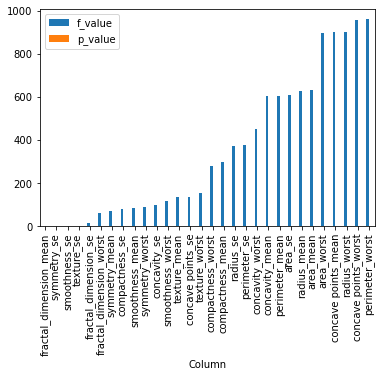

In [31]:
f_value,p_value=f_classif(x_new,y_new)
df1_anova=pd.DataFrame({'Column':x_new.columns,'f_value':f_value,'p_value':p_value})
df1_anova.sort_values('f_value',ascending=False)                                     ## f_value and p_value are opposite in nature i.e. higher the f_value then lower will be the p_value
df1_anova.set_index('Column').sort_values('f_value').plot(kind='bar')

#### Finding the most common redundant columns from all the feature selection techniques

In [32]:
redundant_fields='''fractal_dimension_mean,symmetry_se,smoothness_se,texture_se,fractal_dimension_se,fractal_dimension_worst,smoothness_mean,symmetry_worst,
area_worst,fractal_dimension_se,radius_mean,fractal_dimension_mean,area_se,concave_points_se,smoothness_se,texture_mean,
perimeter_mean,smoothness_worst,fractal_dimension_mean,smoothness_mean,concave point_worst,concavity_se,concave point_mean,
texture_se,smoothness_se,symmetry_se,fractal_dimension_mean,fractal_dimension_se,fractal_dimension_worst,symmetry_mean,compactness_se'''

coulumns_list=redundant_fields.split(',')

In [33]:
from collections import Counter

In [34]:
dict_columns=Counter(coulumns_list).most_common(7)
print(dict_columns)

[('fractal_dimension_mean', 4), ('smoothness_se', 3), ('fractal_dimension_se', 3), ('symmetry_se', 2), ('fractal_dimension_worst', 2), ('smoothness_mean', 2), ('texture_se', 1)]


# 5),6) Model Training and Model Evaluation

In [35]:
df3=pd.concat([x_new,y_new],axis=1)
df3

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,y
0,4.169123,3.375735,0.008143,6.908755,-0.926648,-0.556581,0.547814,0.383536,4.133940,-1.103970,...,17.33,5.218191,7.610358,0.1622,-0.407066,0.843742,0.2654,2.173441,-2.129472,1
1,4.362470,4.151372,0.007524,7.189922,-1.071912,-1.104356,0.294788,0.264896,5.518764,-1.246647,...,23.41,5.067646,7.578657,0.1238,-1.678788,0.491528,0.1860,3.636364,-2.418894,1
2,4.299391,4.409391,0.007692,7.092574,-0.960189,-0.796152,0.444297,0.357631,4.833253,-1.221921,...,25.53,5.027165,7.443664,0.1444,-0.856843,0.671118,0.2430,2.767783,-2.435203,1
3,3.513491,4.349082,0.012890,5.956096,-0.846185,-0.546835,0.491325,0.324345,3.850597,-1.011263,...,26.50,4.593806,6.341593,0.2098,-0.143524,0.828794,0.2575,1.506478,-1.754464,1
4,4.342697,3.841973,0.007402,7.167809,-0.998699,-0.876802,0.444972,0.322955,5.527916,-1.230401,...,16.67,5.025195,7.362011,0.1374,-1.584745,0.632456,0.1625,4.230118,-2.566811,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
563,4.386811,4.649041,0.006993,7.205635,-0.959002,-0.650528,0.563383,0.383927,4.653327,-1.162475,...,29.41,5.187944,7.506042,0.1407,-0.870839,0.812342,0.2542,3.414135,-2.315366,1
564,4.430285,4.484783,0.007042,7.299121,-0.954677,-0.935917,0.493862,0.372693,5.793743,-1.250032,...,26.40,5.112590,7.614312,0.1410,-1.554476,0.640859,0.2216,4.854369,-2.642965,1
565,4.331275,4.820179,0.007622,7.139660,-1.009661,-0.985479,0.379473,0.312906,5.707763,-1.257039,...,38.25,5.043425,7.456455,0.1166,-1.649219,0.567010,0.1628,3.888025,-2.712510,1
566,4.053111,4.811471,0.009234,6.754721,-1.072886,-0.990124,0.304155,0.230261,6.289308,-1.248105,...,34.12,4.841822,7.024649,0.1139,-1.173120,0.583352,0.1418,4.508566,-2.548486,1


In [36]:
x_train,x_test,y_train,y_test=train_test_split(x_new,y_new,test_size=0.25,random_state=13)

## 5.1) Logistic Regression

In [40]:
le_model=LogisticRegression()
le_model.fit(x_train,y_train)

LogisticRegression()

In [41]:
y_pred_test=le_model.predict(x_test)
accuracy=accuracy_score(y_test,y_pred_test)
accuracy

0.9784172661870504

## 5.2) Decision Tree

In [42]:
dt_model=DecisionTreeClassifier()
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [43]:
y_pred_test=dt_model.predict(x_test)
accuracy=accuracy_score(y_test,y_pred_test)
accuracy

0.935251798561151

## 5.3) Random Forest

In [44]:
rf_model=RandomForestClassifier()
rf_model.fit(x_train,y_train)

RandomForestClassifier()

In [45]:
y_pred_test=rf_model.predict(x_test)
accuracy=accuracy_score(y_test,y_pred_test)
accuracy

0.9568345323741008

## 5.4) AdaBoost

In [46]:
ab_model=AdaBoostClassifier()
ab_model.fit(x_train,y_train)

AdaBoostClassifier()

In [47]:
y_pred_test=ab_model.predict(x_test)
accuracy=accuracy_score(y_test,y_pred_test)
accuracy

0.9496402877697842

## 5.5) XgBoost

In [48]:
normal_scaler=MinMaxScaler()
x_train_normal=normal_scaler.fit_transform(x_train)
x_test_normal=normal_scaler.fit_transform(x_test)

with open(r'C:\Users\Omkar\Desktop\Practice\Datasets\Breast Cancer Wisconsin\artifacts\normal_scaler.pkl','wb') as file2:
    pkl.dump(normal_scaler,file2)

In [49]:
xgb_model=xgboost.XGBClassifier()
xgb_model.fit(x_train_normal,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [50]:
y_pred_test=xgb_model.predict(x_test_normal)
accuracy=accuracy_score(y_test,y_pred_test)
accuracy

0.9784172661870504

In [51]:
with open(r'C:\Users\Omkar\Desktop\Practice\Datasets\Breast Cancer Wisconsin\artifacts\xgb_model.pkl','wb') as file:
    pkl.dump(xgb_model,file)

In [52]:
columns=x_train.columns.to_list()

In [53]:
with open(r'C:\Users\Omkar\Desktop\Practice\Datasets\Breast Cancer Wisconsin\artifacts\x_columns.json','w') as file1:
    json.dump(columns,file1)

# PCA

In [40]:
scaler=MinMaxScaler()
x_train_scaled=scaler.fit_transform(x_train)
x_test_scaled=scaler.fit_transform(x_test)

x_train_normal=pd.DataFrame(x_train_scaled,columns=x_train.columns)
x_test_normal=pd.DataFrame(x_test_scaled,columns=x_test.columns)
x_train_normal

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0.416771,0.418613,0.427866,0.430473,0.170874,0.294307,0.284565,0.153098,0.695303,0.180175,...,0.332883,0.421109,0.315722,0.336212,0.210354,0.431753,0.402123,0.147261,0.431582,0.202196
1,0.744279,0.646589,0.107524,0.740328,0.859465,1.000000,0.934736,0.881501,0.030699,0.731120,...,0.695769,0.525053,0.745662,0.672891,0.602625,0.842423,0.796252,0.870830,0.067937,0.447228
2,0.802086,0.551597,0.096467,0.807451,0.486187,0.803476,0.702954,0.707276,0.510243,0.321765,...,0.827465,0.430704,0.837299,0.803419,0.335035,0.764877,0.682714,0.630840,0.414341,0.358568
3,0.715851,0.492646,0.169038,0.716881,0.600767,0.629482,0.546773,0.616666,0.473825,0.183360,...,0.762516,0.334488,0.717395,0.739010,0.499089,0.647627,0.578485,0.687689,0.297540,0.366354
4,0.495604,0.648080,0.342558,0.505593,0.430805,0.517557,0.232956,0.317925,0.535368,0.240317,...,0.434494,0.455490,0.415997,0.434309,0.220561,0.477819,0.227173,0.218359,0.503477,0.207204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412,0.359142,0.439249,0.485721,0.369925,0.387545,0.429553,0.266679,0.270373,0.361602,0.329960,...,0.315024,0.351812,0.303149,0.314198,0.294933,0.481430,0.363826,0.263874,0.349325,0.294130
413,0.476908,0.602893,0.348422,0.486638,0.604215,0.619402,0.564685,0.504873,0.385072,0.269631,...,0.397804,0.593017,0.424840,0.400866,0.413781,0.605191,0.572185,0.458493,0.450509,0.314155
414,0.362912,0.380245,0.476071,0.378401,0.456806,0.437264,0.245020,0.265578,0.510927,0.252517,...,0.341396,0.298241,0.326236,0.341305,0.265038,0.490267,0.335911,0.280029,0.473703,0.244039
415,0.975176,0.580984,0.012121,0.960630,0.666818,0.795054,0.811151,0.962531,0.458630,0.215616,...,0.940659,0.555171,0.915594,0.905043,0.480860,0.718760,0.651659,0.935595,0.408520,0.289483


In [43]:
pca=PCA(n_components=20)
x_train_pca=pca.fit_transform(x_train_normal)
x_test_pca=pca.transform(x_test_normal)

with open(r'Desktop\Practice\Datasets\Breast Cancer Wisconsin\artifacts\PCA.pkl','wb') as file:
    

pca_columns=[f'PC{i}' for i in range(1,x_train_pca.shape[1]+1)]
x_train_pca=pd.DataFrame(x_train_pca,columns=pca_columns)
x_test_pca=pd.DataFrame(x_test_pca,columns=pca_columns)
x_train_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,-0.642173,-0.243841,0.034284,0.243241,0.229234,-0.112115,0.177941,0.039889,-0.151389,-0.194771,-0.181002,0.045352,0.134005,0.018477,-0.035945,-0.012302,0.043101,-0.015001,-0.017385,0.042055
1,1.636781,0.620080,0.227532,-0.087183,-0.258609,-0.338512,0.140363,0.146449,-0.161169,-0.064785,0.163754,0.025093,0.107577,0.135131,-0.131817,0.056161,0.015296,0.004345,0.035370,-0.053249
2,1.236145,-0.307893,0.216193,-0.097415,0.164064,-0.045280,-0.201469,0.034642,-0.020494,-0.073961,-0.031882,0.130310,0.038362,0.047271,-0.047097,-0.025212,-0.024055,-0.010195,-0.002053,-0.003094
3,0.787939,-0.433633,-0.278339,-0.124580,-0.117072,0.040612,-0.078636,-0.082283,-0.008453,-0.034662,0.020537,-0.009222,-0.017641,-0.088701,0.000568,-0.020571,0.000678,-0.029349,-0.012376,0.025341
4,-0.214281,-0.292944,0.175588,0.122956,-0.012446,-0.085421,-0.092521,0.094891,-0.062302,0.152228,0.093023,0.036981,-0.039483,-0.018072,0.010195,-0.023082,0.029423,0.033624,-0.032106,0.001280
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412,-0.449133,0.008501,-0.134332,0.074418,-0.019499,-0.167563,0.022490,-0.018016,0.049682,0.022702,-0.056365,-0.059503,0.036683,0.018074,-0.020698,0.003641,0.013118,0.011028,0.013270,0.021661
413,0.193755,0.129819,-0.012788,0.329894,0.086733,0.075321,0.256765,0.094404,0.122651,0.064770,-0.105752,0.018040,0.079592,-0.053807,0.056781,0.019713,-0.062220,0.005145,0.022801,-0.029732
414,-0.445415,-0.126136,-0.094110,-0.000250,0.048248,-0.007905,-0.011237,0.003011,0.122358,0.008914,-0.057996,0.055619,-0.027972,-0.018641,0.023242,0.025668,0.023386,-0.022963,0.015069,0.027930
415,1.516731,-0.556219,0.018068,0.032353,-0.127712,0.120408,0.088985,0.185626,0.033883,-0.095116,-0.031743,0.024030,0.005362,0.097408,0.112144,-0.020983,0.026617,-0.029737,0.001948,-0.038170


In [44]:
xgb=xgboost.XGBClassifier()
xgb.fit(x_train_pca,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [47]:
y_test_predict=xgb.predict(x_test_pca)
accuracy=accuracy_score(y_test,y_test_predict)
accuracy

0.935251798561151

# 7) Flask (Model Deployment)

In [1]:
## Written in VS Code (main.py file present in this repository)